# CarrerCon 2019 - Robot Navigation Classification
[Instructions](https://www.kaggle.com/c/career-con-2019/overview)
_Goal_ : Classify type of ground the robot is on

_Metric_ : Multiclass accuracy

### Download Data
Run once!

In [119]:
! wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1VS9wCxmov4tINYwpzDebpkjK_sIkG5FW' -O X_test.csv
! wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1ANelxLBBbsq1z-X1vEbpIZxalymJOar3' -O X_train.csv
! wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1Ow4XwXHokbQYwdPBIiRd_E3yi8uj7Q6r' -O y_train.csv

--2020-07-21 07:35:31--  https://docs.google.com/uc?export=download&id=1VS9wCxmov4tINYwpzDebpkjK_sIkG5FW
Resolving docs.google.com (docs.google.com)... 172.253.122.138, 172.253.122.100, 172.253.122.101, ...
Connecting to docs.google.com (docs.google.com)|172.253.122.138|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0o-24-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/5bb9ks9s00a5h4ffeas2rljlbr3v4rd5/1595316900000/07239704937012393196/*/1VS9wCxmov4tINYwpzDebpkjK_sIkG5FW?e=download [following]
--2020-07-21 07:35:33--  https://doc-0o-24-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/5bb9ks9s00a5h4ffeas2rljlbr3v4rd5/1595316900000/07239704937012393196/*/1VS9wCxmov4tINYwpzDebpkjK_sIkG5FW?e=download
Resolving doc-0o-24-docs.googleusercontent.com (doc-0o-24-docs.googleusercontent.com)... 172.217.13.65, 2607:f8b0:4004:801::2001
Connecting to doc-0o-24-docs.googleusercontent.com (doc-0o

In [111]:
! ls

1FeNE44A-g6IvyC-hCtZhyVMhsvh8b8OZ  GroundClassification.ipynb  What I did & Why


## Imports

In [4]:
import pandas as pd
import numpy as np
from scipy.fft import fft
from scipy.spatial import distance_matrix
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier


import torch
from torch import nn, tensor, Tensor
from torch.utils.data import *

# Visualizations
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns

from torch.utils.tensorboard import SummaryWriter

from tqdm.notebook import tqdm

## Consts

In [5]:
TRAIN_X_PATH = 'X_train.csv'
TRAIN_Y_PATH = 'y_train.csv'
TEST_X_PATH = 'X_test.csv'
OUT_PATH = "MySub.csv"

INDEX_COL = 'row_id'
TARGET_COL = 'surface'
ORIANTATION_COLS = ['orientation_X', 'orientation_Y', 'orientation_Z', 'orientation_W']
EULER_COLS = ['phi', 'theta', 'psi']
VELOCITY_COLS = ['angular_velocity_X', 'angular_velocity_Y', 'angular_velocity_Z']
ACCELERATION_COLS = ['linear_acceleration_X', 'linear_acceleration_Y', 'linear_acceleration_Z']
TARGET_AS_NUMERIC = {
    'carpet':0,
    'concrete':1,
    'fine_concrete':2,
    'hard_tiles':3,
    'hard_tiles_large_space':4,
    'soft_pvc':5,
    'soft_tiles':6,
    'tiled':7,
    'wood':8
}

TARGET_AS_STR = {
    0:'carpet',
    1:'concrete',
    2:'fine_concrete',
    3:'hard_tiles',
    4:'hard_tiles_large_space',
    5:'soft_pvc',
    6:'soft_tiles',
    7:'tiled',
    8:'wood'
}

RANDOM_SEED = 6

TRAIN_SIZE = 0.5
VAL_SIZE = 0.5
FOLD_NUM= 10
CLASS_NUM = 9
SIGNAL_LEN = 128

BATCH_SIZE = 64


torch.set_default_tensor_type('torch.cuda.FloatTensor')
torch.cuda.set_device('cuda:1')

## Reading Data

In [6]:
full_x_df = pd.read_csv(TRAIN_X_PATH, index_col=INDEX_COL)
full_y_df = pd.read_csv(TRAIN_Y_PATH)
test_x_df = pd.read_csv(TEST_X_PATH, index_col=INDEX_COL)

In [4]:
full_x_df.describe()

,series_id,measurement_number,orientation_X,orientation_Y,orientation_Z,orientation_W,angular_velocity_X,angular_velocity_Y,angular_velocity_Z,linear_acceleration_X,linear_acceleration_Y,linear_acceleration_Z
count,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000
mean,1904.500000,63.500000,-0.018050,0.075062,0.012458,-0.003804,0.000178,0.008338,-0.019184,0.129281,2.886468,-9.364886
std,1099.853353,36.949327,0.685696,0.708226,0.105972,0.104299,0.117764,0.088677,0.229153,1.870600,2.140067,2.845341
min,0.000000,0.000000,-0.989100,-0.989650,-0.162830,-0.156620,-2.371000,-0.927860,-1.268800,-36.067000,-121.490000,-75.386000
25%,952.000000,31.750000,-0.705120,-0.688980,-0.089466,-0.106060,-0.040752,-0.033191,-0.090743,-0.530833,1.957900,-10.193000
50%,1904.500000,63.500000,-0.105960,0.237855,0.031949,-0.018704,0.000084,0.005412,-0.005335,0.124980,2.879600,-9.365300
75%,2857.000000,95.250000,0.651803,0.809550,0.122870,0.097215,0.040527,0.048068,0.064604,0.792263,3.798800,-8.522700
max,3809.000000,127.000000,0.989100,0.988980,0.155710,0.154770,2.282200,1.079100,1.387300,36.797000,73.008000,65.839000


In [5]:
# Class distributions
fig = px.histogram(data_frame=full_y_df, x=TARGET_COL)
fig.update_layout(xaxis_title="Surface", yaxis_title="Count", title_text="Series per Class")

In [7]:
# encode target values
full_y_df.surface.replace(TARGET_AS_NUMERIC, inplace=True)

# train/val split
train_y_df, val_y_df, _, _ = train_test_split(full_y_df, full_y_df.surface, 
                                              stratify=full_y_df.surface, 
                                              train_size=TRAIN_SIZE,
                                              random_state=RANDOM_SEED)

### Viewing Examples

In [472]:
def plot_raw_features(ser_id):
    rel_df = full_x_df.loc[full_x_df.series_id == ser_id]

    fig = make_subplots(rows=5, cols=2, subplot_titles=ORIANTATION_COLS+VELOCITY_COLS+ACCELERATION_COLS)
    c_row, c_col = 1,1
    for col in ORIANTATION_COLS+VELOCITY_COLS+ACCELERATION_COLS:

        fig.add_trace(
            go.Scatter(x=rel_df.measurement_number, y=rel_df[col]),
            row=c_row, col=c_col
        )

        # Update subpplot location
        c_col =  1 if (c_col+1)%3==0 else c_col+1
        c_row = c_row if c_col!=1 else c_row+1
    fig.show()
    return full_y_df.loc[full_y_df.series_id==ser_id, TARGET_COL].values[0]

In [473]:
# Viewing example robot movement
t0 = plot_raw_features(0)
t1 = plot_raw_features(1)
t3 = plot_raw_features(3)
print(f"t0={t0} , t1={t1} , t3={t3}")

t0=2 , t1=1 , t3=1


In [94]:
df_with_labels = pd.merge(left=full_x_df, right=full_y_df,how='inner',on='series_id')
df_with_labels = df_with_labels.groupby(['surface','measurement_number']).mean().reset_index()
# px.line(df_with_labalels, y='linear_acceleration_Y', color='surface')


fig = make_subplots(rows=5, cols=2, subplot_titles=ORIANTATION_COLS+VELOCITY_COLS+ACCELERATION_COLS)
c_row, c_col = 1,1
for col in ORIANTATION_COLS+VELOCITY_COLS+ACCELERATION_COLS:
    for c_index in set(df_with_labels[TARGET_COL]):
        fig.add_trace(
            px.line(df_with_labels, y=col, color='surface').data[c_index],
            row=c_row, col=c_col
        )

    # Update subpplot location
    c_col =  1 if (c_col+1)%3==0 else c_col+1
    c_row = c_row if c_col!=1 else c_row+1
fig.update_layout(showlegend=False)
fig.show()

In [34]:
full_y_df.loc[(full_y_df.series_id > 6) & (full_y_df.series_id < 12)]

,series_id,group_id,surface
7,7,31,1
8,8,33,4
9,9,11,7
10,10,26,5
11,11,1,7


In [84]:
from scipy.signal import *
example_signals = full_x_df.loc[(full_x_df.series_id > 6) & (full_x_df.series_id < 12), 
                                ['series_id','linear_acceleration_X']]
for ser in list(set(example_signals.series_id)):
    example_signals.loc[example_signals.series_id == ser, 
                        'linear_acceleration_X'] = np.abs(fft(example_signals.loc[example_signals.series_id == ser, 
                                                                                  'linear_acceleration_X'].values[:128]))
px.line(example_signals, y='linear_acceleration_X', color='series_id')
# px.line(y=np.abs(fft(example_signal.values)))

### Figuring out why val score >> test score

#### Distribuion ignoring class

In [64]:
# sns.kdeplot()
train_to_plot_df = full_x_df.drop('measurement_number', axis=1).groupby(['series_id']).mean()
train_to_plot_df['hue'] = "train"
test_to_plot_df = test_x_df.drop('measurement_number', axis=1).groupby(['series_id']).mean()
test_to_plot_df['hue'] = "test"
train_test_df = train_to_plot_df.append(test_to_plot_df)
train_test_df.shape

(7626, 11)

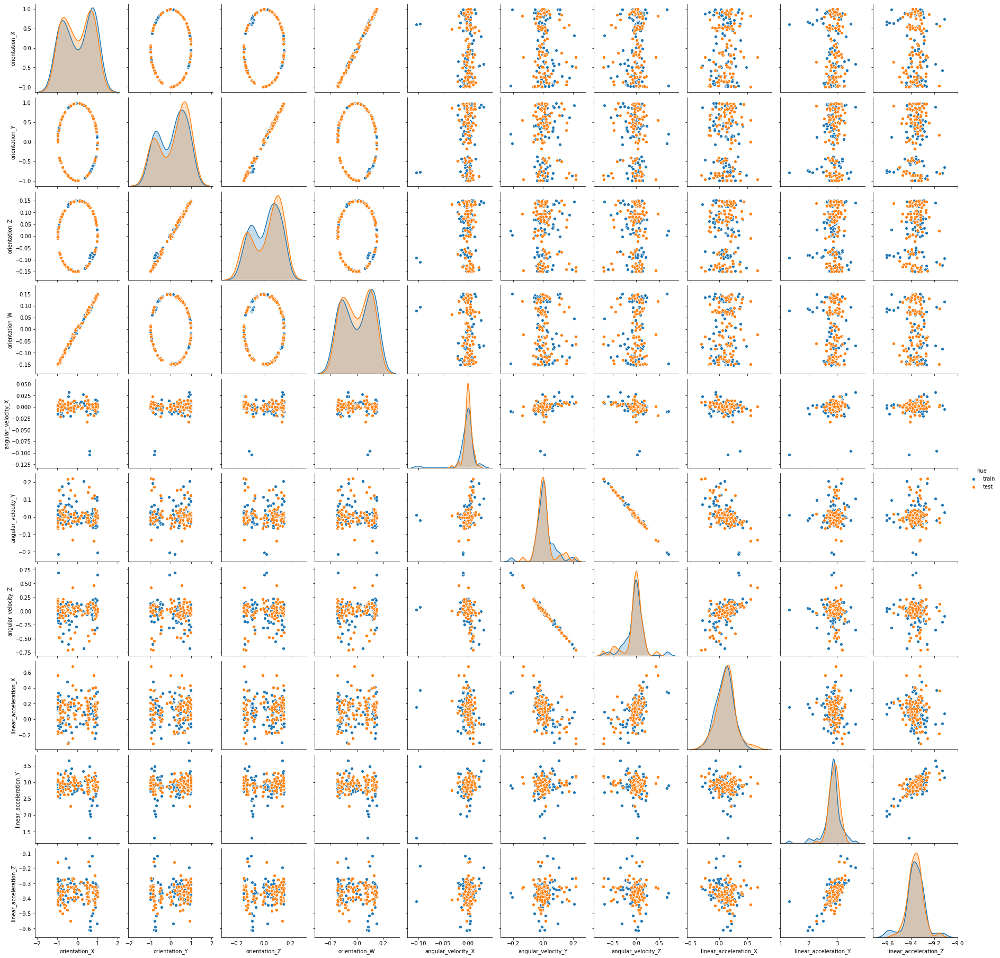

In [67]:
sns.pairplot(train_test_df.sample(frac=0.025), hue="hue")

#### Looking at Group_id
_"group_id: ID number for all of the measurements taken in a recording session. Provided for the training set only, to enable more cross validation strategies."_

In [407]:
full_y_df.loc[full_y_df.surface == 3, 'group_id'].nunique()

1

In [408]:
df_with_labels = pd.merge(left=full_x_df, right=full_y_df,how='inner',on='series_id')
specific_surface_distance_examination_df = df_with_labels.loc[
    (df_with_labels.surface==3) & ((df_with_labels.measurement_number==0) | (df_with_labels.measurement_number==127)), 
    ['measurement_number', 
     'orientation_X', 'orientation_Y', 'orientation_Z', 'orientation_W']].sort_values(by='orientation_X')
specific_surface_distance_examination_df#.diff()

,measurement_number,orientation_X,orientation_Y,orientation_Z,orientation_W
144127,127,0.46074,-0.87507,-0.128320,0.074212
144000,0,0.47576,-0.86691,-0.127360,0.076796
206207,127,0.47593,-0.86681,-0.127380,0.076858
206080,0,0.50266,-0.85153,-0.125190,0.080926
102271,127,0.50290,-0.85140,-0.125140,0.080959
102144,0,0.53601,-0.83087,-0.122470,0.085782
186239,127,0.53630,-0.83069,-0.122350,0.085859
163456,0,0.54475,-0.82551,-0.118870,0.087492
163583,127,0.57201,-0.80694,-0.115350,0.091383
5760,0,0.57222,-0.80680,-0.115290,0.091309


Looking at the above diffs between end of one and start of another series, it looks like group_id resembles long series that was split to different serieses (with the same surface)

### Merge serieses from the same group

In [8]:
# TRYING TO USE Gradient (~10 min run)
df_with_labels = pd.merge(left=full_x_df, right=full_y_df,how='inner',on='series_id')
new_full_x_df = full_x_df.copy()

for gid in tqdm(set(df_with_labels.group_id)):
    example = df_with_labels.loc[df_with_labels.group_id==gid, # 15 sucks
                                 ['series_id','measurement_number', 
                                  'orientation_X', 'orientation_Y', 'orientation_Z', 'orientation_W']]

    for ser in list(set(example.series_id)):
        curr_ser = example.loc[df_with_labels.series_id == ser, 
                               ['measurement_number', 
                                'orientation_X', 'orientation_Y', 'orientation_Z', 'orientation_W']].set_index('measurement_number')
        curr_ser_gra = pd.DataFrame(data=np.gradient(curr_ser, axis=0), 
                                    columns=[f"{old_col}_grad" for old_col in curr_ser.columns])
        for curr_col in curr_ser_gra.columns:
            example.loc[example.series_id==ser, curr_col] = curr_ser_gra[curr_col].values

    example_ends = example.loc[(example.measurement_number==0)|(example.measurement_number==127)]
    example_ends.head()


    dists = pd.DataFrame(data=distance_matrix(x=example_ends.loc[example_ends.measurement_number==0].drop(['series_id', 
                                                                                                'measurement_number'], 
                                                                axis=1), 
                                              y=example_ends.loc[example_ends.measurement_number==127].drop(['series_id', 
                                                                                                  'measurement_number'], 
                                                                axis=1)),
                        columns=example_ends.series_id.drop_duplicates(), index=example_ends.series_id.drop_duplicates())

    curr_best_dist = 10 ** 8 # a large number
    curr_best_guess = []

    for guessed_start in dists.columns:
        total_dist = 0
        dists_copy = dists.copy()
        guessed_order = [guessed_start]
        while len(guessed_order)<len(dists):
            guessed_order.append(dists_copy[guessed_order[-1]].drop([guessed_order[-1]]).idxmin())
            total_dist+=dists_copy[guessed_order[-1]].drop([guessed_order[-1]]).min()
            dists_copy.drop(guessed_order[-2], axis=1, inplace=True)
            dists_copy.drop(guessed_order[-2], axis=0, inplace=True)
        if curr_best_dist > total_dist:
            curr_best_dist = total_dist
            curr_best_guess = guessed_order

    new_example = pd.DataFrame(columns=example.columns)
    for ser in curr_best_guess:
        new_example=new_example.append(example.loc[example.series_id == ser])

    new_full_x_df.loc[full_x_df.series_id.isin(set(new_example.series_id)), 'series_id'] = gid
    new_full_x_df.loc[full_x_df.series_id.isin(set(new_example.series_id)), 'measurement_number'] = range(len(new_full_x_df.loc[full_x_df.series_id.isin(set(new_example.series_id)), 'series_id']))
print(f'Done merging serieses by group. Have {len(new_full_x_df.series_id.drop_duplicates())} serieses in new_full_x_df')


Done merging serieses by group. Have 73 serieses in new_full_x_df


##### Old

In [508]:
full_y_df.loc[full_y_df.group_id==0].head()

,series_id,group_id,surface
70,70,0,1
94,94,0,1
139,139,0,1
144,144,0,1
151,151,0,1


In [430]:
# Old

dists = pd.DataFrame(data=distance_matrix(x=example_ends.loc[example_ends.measurement_number==0].drop(['series_id', 
                                                                                            'measurement_number'], 
                                                            axis=1), 
                                          y=example_ends.loc[example_ends.measurement_number==127].drop(['series_id', 
                                                                                              'measurement_number'], 
                                                            axis=1)),
                    columns=example_ends.series_id.drop_duplicates(), index=example_ends.series_id.drop_duplicates())

curr_best_dist = 10 ** 8 # a large number
curr_best_guess = []

for guessed_start in dists.columns:
    total_dist = 0
    dists_copy = dists.copy()
    guessed_order = [guessed_start]
    while len(guessed_order)<len(dists):
        guessed_order.append(dists_copy[guessed_order[-1]].drop([guessed_order[-1]]).idxmin())
        total_dist+=dists_copy[guessed_order[-1]].drop([guessed_order[-1]]).min()
        dists_copy.drop(guessed_order[-2], axis=1, inplace=True)
        dists_copy.drop(guessed_order[-2], axis=0, inplace=True)
    if curr_best_dist > total_dist:
        curr_best_dist = total_dist
        curr_best_guess = guessed_order


In [431]:
#Old
new_example = pd.DataFrame(columns=example.columns)
for ser in curr_best_guess:
    new_example=new_example.append(example.loc[example.series_id == ser])

In [432]:
#Old
px.line(new_example, y='orientation_Z')

## Data Prep

### Adding Features

#### Euler Angles

In [9]:
# relies on https://stackoverflow.com/questions/56207448/efficient-quaternions-to-euler-transformation
def quat_to_eulaer(w,x,y,z):
    t0 = 2*(w*x + y*z)
    t1 = 1 - 2*(x**2 + y**2)
    phi = np.arctan2(t0, t1)

    t2 = 2*(w*y - z*x)
    t2 = np.where(t2>1,1,t2)
    t2 = np.where(t2<-1, -1, t2)
    theta = np.arcsin(t2)

    t3 = 2*(w*z + x*y)
    t4 = 1 - 2*(y**2 + z**2)
    psi = np.arctan2(t3, t4)

    return phi, theta, psi


# To reduce the amount of data, transform quaternions to euler angles
new_full_x_df['phi'],new_full_x_df['theta'],new_full_x_df['psi'] = quat_to_eulaer(new_full_x_df.orientation_W, 
                                                                                  new_full_x_df.orientation_X, 
                                                                                  new_full_x_df.orientation_Y, 
                                                                                  new_full_x_df.orientation_Z)

test_x_df['phi'],test_x_df['theta'],test_x_df['psi'] = quat_to_eulaer(test_x_df.orientation_W, 
                                                                      test_x_df.orientation_X, 
                                                                      test_x_df.orientation_Y, 
                                                                      test_x_df.orientation_Z)

In [10]:
# Drop original location related features because highly resemble Euler ones
new_full_x_df.drop(ORIANTATION_COLS, axis=1, inplace=True) # +['phi', 'theta', 'psi']
test_x_df.drop(ORIANTATION_COLS, axis=1, inplace=True) # +['phi', 'theta', 'psi']

#### L2 Norm

In [11]:
# Get value of something basaed on its values on different axes
def l2_norm(x,y,z):
    return np.sqrt(x**2 + y**2 + z**2)
             
new_full_x_df['l2_acc'] = l2_norm(new_full_x_df.linear_acceleration_X,
                              new_full_x_df.linear_acceleration_Y,
                              new_full_x_df.linear_acceleration_Z)
test_x_df['l2_acc'] = l2_norm(test_x_df.linear_acceleration_X,
                              test_x_df.linear_acceleration_Y,
                              test_x_df.linear_acceleration_Z)

new_full_x_df['l2_vel'] = l2_norm(new_full_x_df.angular_velocity_X,
                              new_full_x_df.angular_velocity_Y,
                              new_full_x_df.angular_velocity_Z)
test_x_df['l2_vel'] = l2_norm(test_x_df.angular_velocity_X,
                              test_x_df.angular_velocity_Y,
                              test_x_df.angular_velocity_Z)

#### FFT

In [12]:
# ~2 min to run
def get_dft(df, ser_id, col_name):
    rel_df = df.loc[df.series_id == ser_id, col_name]
    rel_df_fft = np.abs(fft(rel_df.values))
    return rel_df_fft

cols_for_dft = ['angular_velocity_X', 'angular_velocity_Y'] + ACCELERATION_COLS

for col_to_ft in cols_for_dft:
    for serid in set(new_full_x_df.series_id):
        fft_vals = get_dft(new_full_x_df, serid, col_to_ft)
        new_full_x_df.loc[new_full_x_df.series_id == serid,f'dft_{col_to_ft}'] = fft_vals


px.line(y=new_full_x_df.loc[new_full_x_df.series_id == serid,f'dft_{col_to_ft}'])


In [13]:
# Test set handling
for col_to_ft in cols_for_dft:
    for serid in set(test_x_df.series_id):
        fft_vals = get_dft(test_x_df, serid, col_to_ft)
        test_x_df.loc[test_x_df.series_id == serid,f'dft_{col_to_ft}'] = fft_vals

### Train/Val Split

In [ ]:
val_x_df = new_full_x_df.loc[full_x_df.series_id.isin(val_y_df.series_id)]
train_x_df = full_x_df.loc[full_x_df.series_id.isin(train_y_df.series_id)]

print(f"train shape {train_x_df.shape}, val shape {val_x_df.shape}")

## Models and stuff (ADD BETTER TITLES LATER)

In [31]:
class MyDataset(Dataset):
    def __init__(self, data, target, transformers=[]):
        super(MyDataset)
        self.data = data
        self.transformers = transformers
        self.target = target
    def __len__(self):
        return len(self.data)
    def __getitem__(self, i):
        ans = self.target[i]
        for t in self.transformers:
            ans = t(ans)
        return (self.data[i], ans)

In [32]:
x_grpby = list(new_full_x_df.groupby('series_id'))
group_ids, group_series_df = [el[0] for el in x_grpby], [el[1] for el in x_grpby]
group_series_df = [el[set(group_series_df[0].columns)-set(['series_id','measurement_number'])].values for el in group_series_df]
group_surface = full_y_df[['group_id', 'surface']].sort_values(by='group_id').drop_duplicates().set_index('group_id')

data_tensors = [tensor(el, dtype=torch.float) for el in group_series_df]
target_tensor = tensor(group_surface.surface, dtype=torch.float)

In [33]:
number_of_samples_per_class = 1000
all_agumented_tensors = []
all_targets = []
for surf in set(full_y_df.surface):
    start_indexes = np.random.randint(0,len(data_tensors[surf])-SIGNAL_LEN, number_of_samples_per_class)
    agumented_tensors = [data_tensors[surf][el:el+SIGNAL_LEN] for el in start_indexes]
    all_targets += [tensor(surf, dtype=torch.long) for _ in start_indexes]
    all_agumented_tensors+=agumented_tensors

In [43]:
all_data_tensors = torch.cat(all_agumented_tensors).reshape((number_of_samples_per_class*len(list(set(full_y_df.surface))), 
                                                             SIGNAL_LEN, 
                                                             -1))
all_target_tensors = tensor(all_targets, dtype=torch.long)
train_dataset = TensorDataset(all_data_tensors, all_target_tensors)
train_dl = DataLoader(train_dataset, BATCH_SIZE, shuffle=True)

In [613]:
# Old
train_data_tensor = tensor(train_x_df[set(full_x_df.columns)-set(['series_id','measurement_number'])].values, 
                           dtype=torch.float).reshape((train_x_df['series_id'].nunique(),
                                                        SIGNAL_LEN, -1))
train_target_tensor = tensor(train_y_df.sort_index().surface.values, dtype=torch.float)

train_dataset = TensorDataset(train_data_tensor, train_target_tensor)

# Todo: figure out why now working (cross entropy score)
weights = pd.value_counts(train_target_tensor.cpu().numpy()).sort_index()/len(train_target_tensor.cpu().numpy())
weights = (weights/weights.mean()) ** -1
weights = tensor(weights.values, dtype = torch.float)
sampler = WeightedRandomSampler(weights=weights, num_samples=len(train_dataset))


train_dl = DataLoader(train_dataset, BATCH_SIZE, sampler=sampler)

NameError: name 'train_x_df' is not defined

In [54]:
# Sample model to make sure I am able to run a classifier
class SampleNet(nn.Module):
    def __init__(self):
        super(SampleNet, self).__init__()
        self.lstm = nn.LSTM(input_size=14,
                          hidden_size=512, 
                          num_layers=3,
                          batch_first=True)
        self.gru = nn.GRU(input_size=512,
                          hidden_size=128, 
                          num_layers=3)
        self.cnn = nn.Sequential(
            nn.Linear(in_features=128, out_features=512),
            nn.LeakyReLU(),
            nn.Linear(in_features=512, out_features=128),
            nn.LeakyReLU(),
            nn.Linear(in_features=128, out_features=CLASS_NUM),
            nn.Softmax(dim=1)
            
        )        
    
    def forward(self,x):
        out,states = self.lstm(x)
        out, states = self.gru(out)
        out = self.cnn(out)
        return out


model = SampleNet()
optimizer = torch.optim.Adam(model.parameters())
criterion = nn.CrossEntropyLoss()#weight=weights)
model.cuda()

SampleNet(
  (lstm): LSTM(14, 512, num_layers=3, batch_first=True)
  (gru): GRU(512, 128, num_layers=3)
  (cnn): Sequential(
    (0): Linear(in_features=128, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=512, out_features=128, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=128, out_features=9, bias=True)
    (5): Softmax(dim=1)
  )
)

In [142]:
# criterion(batch_y_preds, y_train_for_criterion)
# y_train_for_criterion.shape
# batch_y_preds[0][40]

# criterion(batch_y_preds, y_train.type(torch.long))

In [150]:
# writer = SummaryWriter()

for epoch in tqdm(range(10)):
    
    for i, (x_train, y_train) in enumerate(iter(train_dl)):
        batch_y_preds = model(x_train)#.reshape(-1, 128*21)
        
        y_train_for_criterion = np.zeros(shape=(len(y_train), CLASS_NUM))
        y_train_for_criterion[np.arange(len(y_train)), y_train.cpu().type(torch.int).numpy()] = 1
        y_train_for_criterion = tensor(y_train_for_criterion, dtype=torch.long)
        
        batch_loss = criterion(batch_y_preds, y_train_for_criterion)
    if epoch % 1 == 0:
        print(batch_loss)
# #         writer.add_scalar('Loss/train', batch_loss, epoch*len(train_dl)+i)
                
    optimizer.zero_grad()
    batch_loss.backward()
    optimizer.step()
    
#     if epoch % 100 == 0:
#         with torch.no_grad():
#             batch_y_preds = model(val_dl.dataset.tensors[0])#.reshape(-1, 128*21))
#             batch_y_preds = [el.cpu().numpy()[-1].argmax() for el in batch_y_preds]
#             print(accuracy_score(y_true=[int(el) for el in val_dl.dataset.tensors[1].cpu().numpy()], 
#                                  y_pred=batch_y_preds))
#         all_preds = []
#         all_real = []
#         for i, (x_val, y_val) in enumerate(iter(val_dl)):
#             batch_y_preds = model(x_val)
#             all_real = all_real + [int(el) for el in y_val.numpy()]
#             all_preds = all_preds + [el[-1].numpy().argmax() for el in batch_y_preds]
#         print(accuracy_score(y_true=all_real, y_pred=all_preds))

tensor(2.2106, grad_fn=<NllLossBackward>)
tensor(2.2914, grad_fn=<NllLossBackward>)
tensor(2.2075, grad_fn=<NllLossBackward>)
tensor(2.2527, grad_fn=<NllLossBackward>)
tensor(2.1456, grad_fn=<NllLossBackward>)
tensor(2.1599, grad_fn=<NllLossBackward>)
tensor(2.1406, grad_fn=<NllLossBackward>)
tensor(2.1901, grad_fn=<NllLossBackward>)
tensor(2.1627, grad_fn=<NllLossBackward>)
tensor(2.1654, grad_fn=<NllLossBackward>)



In [159]:
batch_y_preds.detach().cpu().numpy().argmax(1)

array([5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5])

In [156]:
with torch.no_grad():
    batch_y_preds = model(torch.rand((40,14,128)))#x_train)
#     batch_y_preds = [el.cpu().numpy()[-1].argmax() for el in batch_y_preds]
    print(batch_y_preds)

tensor([[-0.2334, -0.3178,  0.0866, -0.1065,  0.6028,  0.8257,  0.2453, -0.2553,
         -0.7615],
        [-0.2413, -0.3371,  0.0552, -0.1264,  0.6516,  0.9594,  0.2508, -0.2819,
         -0.8475],
        [-0.2273, -0.3501,  0.0823, -0.1249,  0.6587,  0.9482,  0.2976, -0.2570,
         -0.8649],
        [-0.2523, -0.3622,  0.0704, -0.1488,  0.7047,  1.0344,  0.3175, -0.2794,
         -0.9178],
        [-0.2475, -0.3605,  0.0550, -0.1441,  0.7121,  1.0412,  0.3043, -0.2680,
         -0.9133],
        [-0.2450, -0.3545,  0.0617, -0.1381,  0.6732,  0.9923,  0.2914, -0.2667,
         -0.9117],
        [-0.2464, -0.3732,  0.0360, -0.1458,  0.7312,  1.0782,  0.2999, -0.2823,
         -0.9652],
        [-0.2478, -0.3817,  0.0540, -0.1432,  0.7256,  1.0504,  0.2962, -0.2630,
         -0.9503],
        [-0.2489, -0.3741,  0.0324, -0.1505,  0.6960,  1.0216,  0.2637, -0.2887,
         -0.9443],
        [-0.2517, -0.3701,  0.0293, -0.1416,  0.7177,  1.0544,  0.2910, -0.2806,
         -0.9499],


In [22]:
writer = SummaryWriter()

for epoch in tqdm(range(20)):
    
    for i, (x_train, y_train) in enumerate(iter(train_dl)):
        batch_y_preds = model(x_train)#.reshape(-1, 1280))
        
        y_train_for_criterion = np.zeros(shape=(len(y_train), CLASS_NUM))
        y_train_for_criterion[np.arange(len(y_train)), y_train.type(torch.int).numpy()] = 1
        y_train_for_criterion = tensor(y_train_for_criterion, dtype=torch.long)
        
        batch_loss = criterion(batch_y_preds, y_train_for_criterion)
        writer.add_scalar('Loss/train', batch_loss, epoch*len(train_dl)+i)
                
        optimizer.zero_grad()
        batch_loss.backward()
        optimizer.step()
        
    with torch.no_grad():
        all_preds = []
        all_real = []
        for i, (x_val, y_val) in enumerate(iter(val_dl)):
            batch_y_preds = model(x_val)
            all_real = all_real + [int(el) for el in y_val.numpy()]
            all_preds = all_preds + [el[-1].numpy().argmax() for el in batch_y_preds]
        print(accuracy_score(y_true=all_real, y_pred=all_preds))

## Another direction: non numeric

In [21]:
number_of_samples_per_class = 1000
agumented_dfs = []

x_grpby = list(new_full_x_df.groupby('series_id'))
group_ids, group_series_df = [el[0] for el in x_grpby], [el[1] for el in x_grpby]
group_surface = full_y_df[['group_id', 'surface']].sort_values(by='group_id').drop_duplicates().set_index('group_id')

for surf in tqdm(range(CLASS_NUM)):
    dfs_of_specific_surf = group_surface.loc[group_surface.surface==surf]
    df_indexes = [dfs_of_specific_surf.index[el] for el in np.random.randint(0,len(dfs_of_specific_surf), number_of_samples_per_class)]
    start_indexes = [np.random.randint(0,len(group_series_df[df_idx])-SIGNAL_LEN) for df_idx in df_indexes]
    new_agumented_dfs = [group_series_df[df_idx][cell_idx:cell_idx+SIGNAL_LEN] for df_idx,cell_idx in zip(df_indexes, start_indexes)]
    
    # add a new ser_id for the group by and class
    for idx,df in enumerate(new_agumented_dfs):
        df.loc[:,'surface'], df.loc[:,'series_id'] = surf, number_of_samples_per_class * surf + idx
    agumented_dfs = agumented_dfs+new_agumented_dfs

full_agumentated_df = pd.concat(agumented_dfs)

/home/dev/installs/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:844: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/dev/installs/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:965: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [23]:
non_numeric_full_df = full_agumentated_df.drop(['measurement_number', 'theta', 'psi','phi'
                                                'surface'], axis=1).groupby(['series_id']).agg(['mean', 
                                                                                                'std', 
                                                                                                'max', 
                                                                                                'min', 
                                                                                                'median'])
non_numeric_full_df.columns = ['_'.join(col).strip() for col in non_numeric_full_df.columns.values]

non_numeric_target_list = full_agumentated_df.groupby('series_id').mean().surface.astype(int)

non_numeric_test_df = test_x_df.drop(['measurement_number', 'theta', 'psi','phi'], 
                                     axis=1).groupby(['series_id']).agg(['mean', 'std', 'max', 'min', 'median'])
non_numeric_test_df.columns = ['_'.join(col).strip() for col in non_numeric_test_df.columns.values]

x_train, x_val, y_train, y_val = train_test_split(non_numeric_full_df, 
                                                  non_numeric_target_list, 
                                                  stratify=non_numeric_target_list, 
                                                  train_size=TRAIN_SIZE,
                                                  random_state=RANDOM_SEED)

In [446]:
# Old (original serieses)
non_numeric_full_df = full_x_df.drop(['measurement_number'],#+ORIANTATION_COLS+['theta', 'psi','phi'], 
                                     axis=1).groupby(['series_id']).agg(['mean', 'std', 'max', 'min', 'median'])
                                                                         #'idxmax', 'idxmin'])
non_numeric_full_df.columns = ['_'.join(col).strip() for col in non_numeric_full_df.columns.values]

non_numeric_test_df = test_x_df.drop(['measurement_number'],#+ORIANTATION_COLS+['theta', 'psi','phi'], 
                                     axis=1).groupby(['series_id']).agg(['mean', 'std', 'max', 'min', 'median'])
non_numeric_test_df.columns = ['_'.join(col).strip() for col in non_numeric_test_df.columns.values]

# non_numeric_full_df.loc[
#     :, non_numeric_full_df.filter(regex='_idxmax$',axis=1).columns
# ] = non_numeric_full_df.filter(regex='_idxmax$', axis=1).applymap(lambda v: int(v.split("_")[-1])) # New 25.7
# non_numeric_full_df.loc[
#     :, non_numeric_full_df.filter(regex='_idxmin$',axis=1).columns
# ] = non_numeric_full_df.filter(regex='_idxmin$', axis=1).applymap(lambda v: int(v.split("_")[-1])) # New 25.7


x_train, x_val, y_train, y_val = train_test_split(non_numeric_full_df, 
                                                  full_y_df.surface, 
                                                  stratify=full_y_df.surface, 
                                                  train_size=TRAIN_SIZE,
                                                  random_state=RANDOM_SEED)

In [71]:
import imblearn

# oversample
oversample = imblearn.over_sampling.SMOTE()
sampled_x, sampled_y = oversample.fit_resample(non_numeric_full_df, full_y_df.surface)
print(f"X.shape = {sampled_x.shape} , y_shape = {sampled_y.shape}")

X.shape = (7011, 120) , y_shape = (7011,)


In [83]:
non_numeric_full_df.shape

(3810, 100)

In [84]:
non_numeric_test_df.shape

(3816, 100)

In [105]:
reg_model = RandomForestClassifier()
kf = StratifiedKFold(n_splits=FOLD_NUM)

all_preds = []
all_real = []

for train_index, val_index in kf.split(non_numeric_full_df, full_y_df.surface):
    x_train, x_val = non_numeric_full_df.loc[train_index], non_numeric_full_df.loc[val_index]
    y_train, y_val = full_y_df.loc[train_index, 'surface'], full_y_df.loc[val_index, 'surface']

    reg_model.fit(x_train, y_train)
    preds = reg_model.predict(x_val)
    
    all_preds = all_preds + list(preds)
    all_real = all_real + list(y_val)
    print(accuracy_score(preds, y_val))

0.7480314960629921
0.7690288713910761
0.7296587926509186
0.8530183727034121
0.8530183727034121
0.8740157480314961
0.847769028871391
0.8923884514435696
0.89501312335958
0.8792650918635171


0.8341207349081364


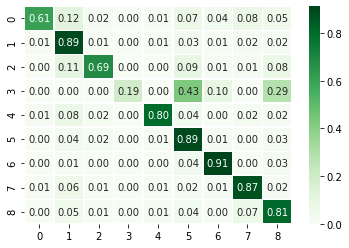

In [106]:
sns.heatmap(confusion_matrix(y_true=all_real, y_pred=all_preds, normalize='true'), 
            cmap='Greens', annot=True, fmt='.2f', linewidths=.5)
print(accuracy_score(all_preds, all_real))

In [58]:
class Net(nn.Module):
    def __init__(self):
        super(Net,self).__init__()
        self.linear1 = nn.Linear(in_features=75, out_features=1280)
        self.linear2 = nn.Linear(in_features=1280, out_features=1000)
        self.linear3 = nn.Linear(in_features=1000, out_features=CLASS_NUM)

        self.relu = nn.ReLU()
        self.logsoftmax = nn.LogSoftmax(dim=1)
    
    def forward(self,x):
        out = self.linear1(x)
        out = self.relu(out)
        out = self.linear2(out)
        out = self.relu(out)
        out = self.linear3(out)
        out = self.relu(out)
        out = self.logsoftmax(out)
        return out

net_model = Net()
net_model = torch.hub.load('pytorch/vision:v0.6.0', 'vgg16', pretrained=True)

# Probably redundant but  make sure all weights will be trained
for param in net_model.features.parameters():
    param.requires_grad = True
for param in net_model.classifier.parameters():
    param.requires_grad = True

# edit first layer - change number of input channels to 1
net_model.classifier[0] = nn.Linear(in_features=100, out_features=net_model.classifier[0].out_features)

features = list(net_model.classifier.children())[:-1] # Remove last layer
features.extend([nn.Linear(net_model.classifier[-1].in_features, CLASS_NUM)]) # Add layer
features.extend([nn.Softmax(dim=1)]) # Add layer

net_model = nn.Sequential(*features) # Replace the model classifier
print(net_model)

Using cache found in /home/ubuntu/.cache/torch/hub/pytorch_vision_v0.6.0


Sequential(
  (0): Linear(in_features=100, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=9, bias=True)
  (7): Softmax(dim=1)
)


In [60]:
train_data_tensor = tensor(x_train.values, dtype=torch.float)
train_target_tensor = tensor(y_train.sort_index().values, dtype=torch.float)

train_dataset = TensorDataset(train_data_tensor, train_target_tensor)

weights = pd.value_counts(train_target_tensor.cpu().numpy()).sort_index()/len(train_target_tensor.cpu().numpy())
weights = (weights/weights.mean()) ** -1
weights = tensor(weights.values, dtype = torch.float)
sampler = WeightedRandomSampler(weights=weights, num_samples=len(train_dataset))


train_dl = DataLoader(train_dataset, BATCH_SIZE, sampler=sampler)

val_data_tensor = tensor(x_val.values, dtype=torch.float)
val_target_tensor = tensor(y_val.sort_index().values, dtype=torch.float)

val_dataset = TensorDataset(val_data_tensor, val_target_tensor)

In [61]:
optimizer = torch.optim.SGD(net_model.parameters(), lr=0.01)
criterion = nn.CrossEntropyLoss()#weight=weights)
net_model.cuda()

Sequential(
  (0): Linear(in_features=100, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=9, bias=True)
  (7): Softmax(dim=1)
)

In [62]:
for epoch in tqdm(range(100)):
    
    for i, (x_train, y_train) in enumerate(iter(train_dl)):
        batch_y_preds = net_model(x_train)
        
        y_train_for_criterion = np.zeros(shape=(len(y_train), CLASS_NUM))
        y_train_for_criterion[np.arange(len(y_train)), y_train.cpu().type(torch.int).numpy()] = 1
        y_train_for_criterion = tensor(y_train_for_criterion, dtype=torch.long)
        
        batch_loss = criterion(batch_y_preds, y_train.type(torch.long))
    if epoch % 10 == 0:
        print(batch_loss)
# #         writer.add_scalar('Loss/train', batch_loss, epoch*len(train_dl)+i)
                
    optimizer.zero_grad()
    batch_loss.backward()
    optimizer.step()
    
    if epoch % 10 == 0:
        with torch.no_grad():
            batch_y_preds = net_model(val_dataset.tensors[0])
            batch_y_preds = [el.cpu().numpy().argmax() for el in batch_y_preds]
            print(accuracy_score(y_true=[int(el) for el in val_dataset.tensors[1].cpu().numpy()], 
                                 y_pred=batch_y_preds))

tensor(2.1869, grad_fn=<NllLossBackward>)
0.18635170603674542
tensor(1.9714, grad_fn=<NllLossBackward>)
0.2047244094488189
tensor(1.8872, grad_fn=<NllLossBackward>)
0.2047244094488189
tensor(2.0577, grad_fn=<NllLossBackward>)
0.2047244094488189
tensor(1.8291, grad_fn=<NllLossBackward>)
0.2047244094488189
tensor(1.8862, grad_fn=<NllLossBackward>)
0.2047244094488189
tensor(1.9720, grad_fn=<NllLossBackward>)
0.2047244094488189
tensor(1.9980, grad_fn=<NllLossBackward>)
0.2047244094488189
tensor(2.0577, grad_fn=<NllLossBackward>)
0.2047244094488189
tensor(1.9148, grad_fn=<NllLossBackward>)
0.2047244094488189



In [63]:
with torch.no_grad():
        batch_y_preds = net_model(val_dataset.tensors[0])
        batch_y_preds = [el.cpu().numpy().argmax() for el in batch_y_preds]
        print(batch_y_preds)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
final accuracy : 1.0


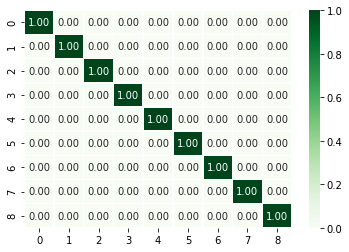

In [24]:
reg_model = XGBClassifier()#study.best_params)
kf = StratifiedKFold(n_splits=FOLD_NUM)

all_preds = []
all_real = []

for train_index, val_index in kf.split(non_numeric_full_df, non_numeric_target_list):#(sampled_x, sampled_y) / (non_numeric_full_df, full_y_df.surface) / non_numeric_target_list
    x_train, x_val = non_numeric_full_df.loc[train_index], non_numeric_full_df.loc[val_index]#sampled_x / non_numeric_full_df
    y_train, y_val = non_numeric_target_list.loc[train_index], non_numeric_target_list.loc[val_index]
    
    reg_model.fit(x_train, y_train)
    preds = reg_model.predict(x_val)
    
    all_preds = all_preds + list(preds)
    all_real = all_real + list(y_val)
    print(accuracy_score(preds, y_val))
sns.heatmap(confusion_matrix(y_true=all_real, y_pred=all_preds, normalize='true'), 
            cmap='Greens', annot=True, fmt='.2f', linewidths=.5)
print(f"final accuracy : {accuracy_score(all_preds, all_real)}")

In [444]:
feature_important = reg_model.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.head(20)

,score
psi_min,1085
psi_max,1071
theta_min,485
phi_max,377
phi_min,363
angular_velocity_Z_min,339
theta_max,307
angular_velocity_Z_max,290
linear_acceleration_Z_std,286
psi_median,281


In [417]:
import optuna

def eval_model(trial):
    eta = trial.suggest_loguniform('eta',0.00001, 1.0)
    max_depth = trial.suggest_int('max_depth',1,9)
    gamma = trial.suggest_loguniform('gamma',0.00001, 1.0)
    lamb = trial.suggest_loguniform('lambda',0.00001, 1.0)
    alpha = trial.suggest_loguniform('alpha',0.00001, 1.0)
    
    reg_model = XGBClassifier(verbosity=1, learning_rate=eta, max_depth=max_depth, 
                              gamma=gamma, reg_alpha=alpha, reg_lambda=lamb,
                              tree_method='gpu_hist')
    
    kf = StratifiedKFold(n_splits=FOLD_NUM)

    all_preds = []
    all_real = []

    for train_index, val_index in kf.split(non_numeric_full_df, full_y_df.surface):
        x_train, x_val = non_numeric_full_df.loc[train_index], non_numeric_full_df.loc[val_index]
        y_train, y_val = full_y_df.loc[train_index, 'surface'], full_y_df.loc[val_index, 'surface']

        reg_model.fit(x_train, y_train)
        preds = reg_model.predict(x_val)

        all_preds = all_preds + list(preds)
        all_real = all_real + list(y_val)
    ret = accuracy_score(y_true=all_real, y_pred=all_preds)
    return ret

study=optuna.create_study(direction='maximize')
study.optimize(eval_model, n_trials=50)


[I 2020-07-25 06:40:43,632] Finished trial#0 with value: 0.7666666666666667 with parameters: {'eta': 0.036106848924590436, 'max_depth': 4, 'gamma': 0.0004301091521927229, 'lambda': 0.6613326121499785, 'alpha': 0.07951510027671788}. Best is trial#0 with value: 0.7666666666666667.
[I 2020-07-25 06:40:47,579] Finished trial#1 with value: 0.6740157480314961 with parameters: {'eta': 0.24324046526134066, 'max_depth': 1, 'gamma': 1.6450569159036795e-05, 'lambda': 0.017426454427425, 'alpha': 0.002744327508786141}. Best is trial#0 with value: 0.7666666666666667.
[I 2020-07-25 06:40:55,026] Finished trial#2 with value: 0.8551181102362204 with parameters: {'eta': 0.7126288564549088, 'max_depth': 4, 'gamma': 4.551810537918477e-05, 'lambda': 0.004940656763007153, 'alpha': 0.06279002045558259}. Best is trial#2 with value: 0.8551181102362204.
[I 2020-07-25 06:41:04,651] Finished trial#3 with value: 0.673753280839895 with parameters: {'eta': 0.0026307074938455746, 'max_depth': 4, 'gamma': 0.0016835400

In [549]:
study.best_value


0.8700787401574803

## Test set

In [479]:
set(non_numeric_test_df.columns).difference(set(non_numeric_full_df.columns))
set(non_numeric_full_df.columns).difference(set(non_numeric_test_df.columns))
non_numeric_full_df.shape
non_numeric_test_df.shape
non_numeric_full_df.columns == non_numeric_test_df.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True])

In [480]:
# Test set
reg_model = XGBClassifier()#study.best_params)

all_preds = []
all_real = []

reg_model.fit(non_numeric_full_df, non_numeric_target_list) #(sampled_x, sampled_y) / (non_numeric_full_df, full_y_df.surface) / non_numeric_target_list
preds = reg_model.predict(non_numeric_test_df)


In [481]:
test_ans = pd.DataFrame(preds, columns=[TARGET_COL])
test_ans.index = test_ans.index.rename("series_id")
test_ans.surface.replace(TARGET_AS_STR, inplace=True)
test_ans.to_csv(OUT_PATH)